In [1]:
import diffrax
import jax
import jax.numpy as jnp
import numpy as np
from jax import random
import diffrax as dfx
import matplotlib.pyplot as plt

from pde_opt.numerics.domains import Domain
from pde_opt.numerics.equations.allen_cahn import AllenCahn2DPeriodicButlerVolmer, AllenCahn2DPeriodicButlerVolmerConstantCurrent

In [2]:
jax.config.update('jax_enable_x64', True)

In [3]:
Nx, Ny = 128, 128
Lx = 0.01 * Nx
Ly = 0.01 * Ny
domain = Domain((Nx, Ny), ((-Lx / 2, Lx / 2), (-Ly / 2, Ly / 2)), "dimensionless")

t_start = 0.0
t_final = 10.0
dt = 0.000001

ts_save = jnp.linspace(t_start, t_final, 200)

kappa = 0.002

In [4]:
eq = AllenCahn2DPeriodicButlerVolmer(
    domain,
    kappa,
    lambda c: jnp.log(c / (1.0 - c)) + 3.0 * (1.0 - 2.0 * c),
    lambda c: jnp.sqrt((1.0 - c) * c),
    0.5,
    derivs="fd"
)

solver = dfx.Tsit5()

In [5]:
key = random.PRNGKey(0)
u0 = 0.5 * jnp.ones((Nx, Ny)) + 0.1 * random.normal(key, (Nx, Ny))

In [6]:
solution = diffrax.diffeqsolve(
    diffrax.ODETerm(jax.jit(lambda t, y, args: eq.rhs(y, t, args))),
    solver,
    t0=t_start,
    t1=t_final,
    dt0=dt,
    y0=u0,
    args=0.5,
    stepsize_controller=diffrax.PIDController(rtol=1e-4, atol=1e-6),
    saveat=diffrax.SaveAt(ts=ts_save),
    max_steps=1000000,
)

In [7]:
import matplotlib.pyplot as plt
from IPython.display import HTML
import matplotlib.animation as animation

fig, ax = plt.subplots(figsize=(4,4))

ims = []
for i in range(0, len(solution.ys), 2):
    im = ax.imshow(solution.ys[i], animated=True, cmap='RdBu', 
                   vmin=0.0, vmax=1.0,
                   extent=[domain.box[0][0], domain.box[0][1], 
                          domain.box[1][0], domain.box[1][1]])
    ims.append([im])

ani = animation.ArtistAnimation(fig, ims, interval=50, blit=True)

plt.title('Allen-Cahn Evolution')
plt.xlabel('x')
plt.ylabel('y')

plt.close()

HTML(ani.to_jshtml())

In [57]:
eq = AllenCahn2DPeriodicButlerVolmerConstantCurrent(
    domain,
    kappa,
    lambda c: jnp.log(c / (1.0 - c)) + 3.0 * (1.0 - 2.0 * c),
    lambda c: jnp.sqrt((1.0 - c) * c),
    0.5,
    0.12,
    derivs="fd"
)

solver = dfx.Tsit5()

In [58]:
key = random.PRNGKey(0)
u0 = jnp.clip(0.1 * jnp.ones((Nx, Ny)) + 0.1 * random.normal(key, (Nx, Ny)), 0.05, 1.0)
print(jnp.max(u0))
print(jnp.min(u0))

0.49981978034999486
0.05


In [59]:
solution = diffrax.diffeqsolve(
    diffrax.ODETerm(jax.jit(lambda t, y, args: eq.rhs(y, t))),
    solver,
    t0=t_start,
    t1=t_final,
    dt0=dt,
    y0=u0,
    stepsize_controller=diffrax.PIDController(rtol=1e-4, atol=1e-6),
    saveat=diffrax.SaveAt(ts=ts_save),
    max_steps=1000000,
)

In [60]:
import matplotlib.pyplot as plt
from IPython.display import HTML
import matplotlib.animation as animation

fig, ax = plt.subplots(figsize=(4,4))

ims = []
for i in range(0, len(solution.ys), 2):
    im = ax.imshow(solution.ys[i], animated=True, cmap='RdBu', 
                   vmin=0.0, vmax=1.0,
                   extent=[domain.box[0][0], domain.box[0][1], 
                          domain.box[1][0], domain.box[1][1]])
    ims.append([im])

ani = animation.ArtistAnimation(fig, ims, interval=50, blit=True)

plt.title('Allen-Cahn Evolution')
plt.xlabel('x')
plt.ylabel('y')

plt.close()

HTML(ani.to_jshtml())

In [61]:
print(jnp.sum(solution.ys[0]))
print(jnp.sum(solution.ys[-1]))

1957.1096958123803
13957.109695812373


In [62]:
print(jnp.mean(solution.ys[0]))
print(jnp.mean(solution.ys[-1]))

0.1194524960822986
0.8518743710822981


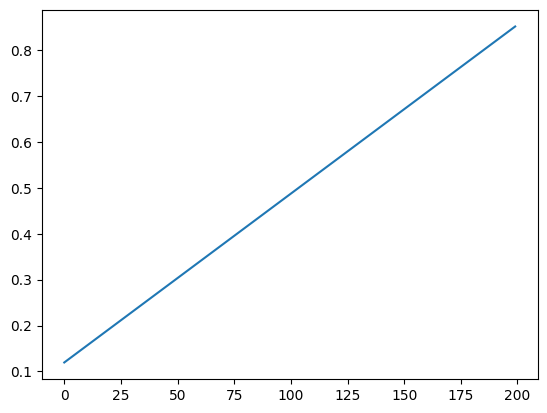

In [63]:
plt.plot(jnp.mean(solution.ys, axis=(1,2)))

In [64]:
voltages = jax.vmap(eq.get_voltage)(solution.ys)

In [65]:
print(voltages.shape)

(200,)


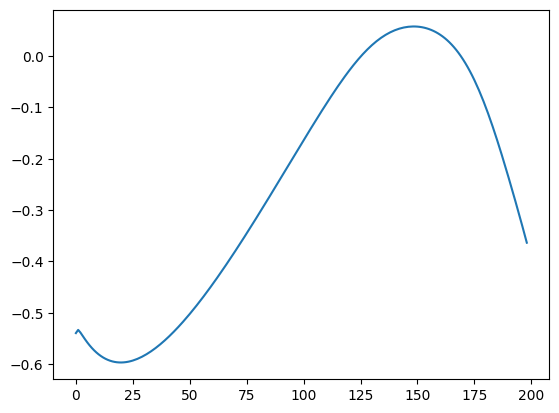

In [66]:
plt.plot(voltages[1:])